# EDA

In [2]:
# For this early part we only need pandas as outr guys!

import pandas as pd

### Let's explore german datasets!

In [3]:
# Load the CSV files

deu_df = pd.read_csv('./MInDS-14/text/de-DE.csv')

In [4]:
deu_df

,filepath,text_asr,text_translated,intent
0,de-DE~CASH_DEPOSIT/response_4.wav,ich möchte gerne Geld auf mein Konto einzahlen,I would like to deposit money into my account,CASH_DEPOSIT
1,de-DE~CASH_DEPOSIT/response_17.wav,Hallo ich möchte fragen ob ich Geld auf mein K...,Hello I would like to ask if I can deposit mon...,CASH_DEPOSIT
2,de-DE~CASH_DEPOSIT/CAd15a78e174ea14ae25901c429...,Hallo ich möchte gerne Geld einbezahlen auf me...,Hello I would like to deposit money into my ac...,CASH_DEPOSIT
3,de-DE~CASH_DEPOSIT/response_16.wav,was muss ich tun um Geld auf mein Konto einzuz...,what do I have to do to deposit money into my ...,CASH_DEPOSIT
4,de-DE~CASH_DEPOSIT/response_7.wav,guten Tag ich wollte gerne Geld einzahlen und ...,"Hello, I wanted to deposit money and wanted to...",CASH_DEPOSIT
...,...,...,...,...
606,de-DE~APP_ERROR/CA506fcd9676c03e4fed44ab49d62c...,hi ich habe ein problem mit meiner App,hi i have a problem with my app,APP_ERROR
607,de-DE~APP_ERROR/CA1fbd480eeb624a84179c84fbe4dd...,Hallo ich rufe an weil ich ihre App benutze un...,"Hello, I'm calling because I am using your app...",APP_ERROR
608,de-DE~APP_ERROR/CAce0acd06a11d75d47736d1300f75...,Hallo ich versuche gerade auf meine bank wir w...,"Hello I'm trying to go to my bank, we would ge...",APP_ERROR
609,de-DE~APP_ERROR/CA5583cb6ac98e848ac43a22a6dc0a...,hallo ich kann leider nicht auf meinen Bank Ac...,hello I can't access my bank account because t...,APP_ERROR


In [5]:
# Check if theres any mising data

# deu_df
print(deu_df.isna().values.any())
print(deu_df.isnull().values.any())

False
False


In [6]:
# Let's see how the data looks like
pd.set_option('max_colwidth', 800)
deu_df.head()

,filepath,text_asr,text_translated,intent
0,de-DE~CASH_DEPOSIT/response_4.wav,ich möchte gerne Geld auf mein Konto einzahlen,I would like to deposit money into my account,CASH_DEPOSIT
1,de-DE~CASH_DEPOSIT/response_17.wav,Hallo ich möchte fragen ob ich Geld auf mein Konto einzahlen kann oder halt wie kann ich das genau machen ich will Bargeld auf mein Konto einzahlen weil ich kann auch von einem Konto auf ein anderes Konto Geld überweisen,Hello I would like to ask if I can deposit money into my account or how can I do that exactly? I want to deposit cash into my account because I can also transfer money from one account to another,CASH_DEPOSIT
2,de-DE~CASH_DEPOSIT/CAd15a78e174ea14ae25901c429ce44e40_0.wav,Hallo ich möchte gerne Geld einbezahlen auf mein Konto wie kann ich das tun,Hello I would like to deposit money into my account how can I do that,CASH_DEPOSIT
3,de-DE~CASH_DEPOSIT/response_16.wav,was muss ich tun um Geld auf mein Konto einzuzahlen,what do I have to do to deposit money into my account,CASH_DEPOSIT
4,de-DE~CASH_DEPOSIT/response_7.wav,guten Tag ich wollte gerne Geld einzahlen und wollte einmal fragen wie es geht und dann auch direkt wie man das Geld aufs Konto überweisen kann,"Hello, I wanted to deposit money and wanted to ask how it works and then how to transfer the money to the account",CASH_DEPOSIT


/var/folders/sf/f6mp34nd5vl3m3wt1sk575br0000gn/T/ipykernel_92232/229814952.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='intent', data=deu_df, order=deu_df['intent'].value_counts().index, palette='flare')


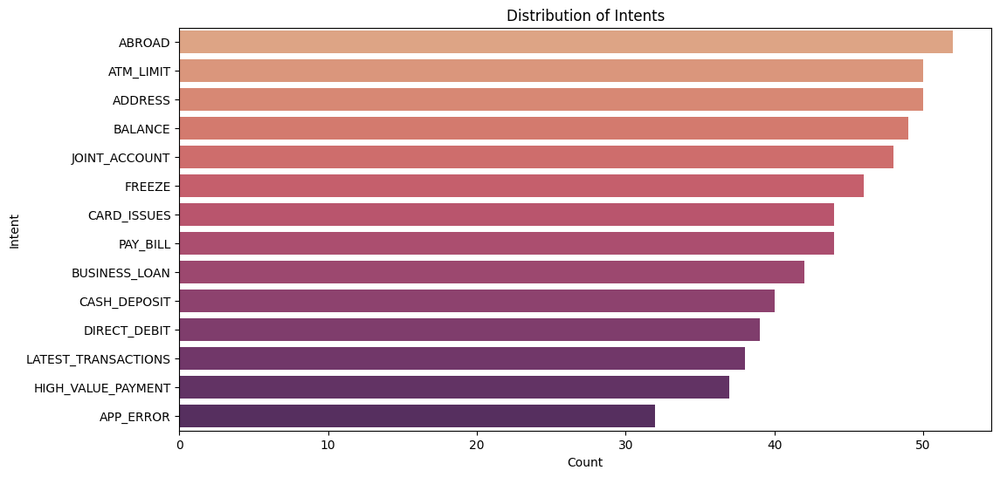

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.countplot(y='intent', data=deu_df, order=deu_df['intent'].value_counts().index, palette='flare')
plt.xlabel('Count')
plt.ylabel('Intent')
plt.title('Distribution of Intents')
plt.show()

In [8]:
deu_df['intent'].unique()

array(['CASH_DEPOSIT', 'LATEST_TRANSACTIONS', 'DIRECT_DEBIT',
       'HIGH_VALUE_PAYMENT', 'BUSINESS_LOAN', 'CARD_ISSUES', 'BALANCE',
       'JOINT_ACCOUNT', 'ATM_LIMIT', 'ADDRESS', 'ABROAD', 'PAY_BILL',
       'FREEZE', 'APP_ERROR'], dtype=object)

### Now Lets Explore the audio data

In [9]:
import os
import pandas as pd
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio

In [10]:
def load_audio_data(csv_file, audio_base_path):
    """
    Load audio data from a CSV file and return a DataFrame with additional audio data.
    """
    df = pd.read_csv(csv_file)
    
    # Add a column for audio data
    df['audio_data'] = df['filepath'].apply(lambda x: load_audio(os.path.join(audio_base_path, x)))
    
    return df

def load_audio(file_path):
    """
    Load an audio file and return the audio data and sample rate.
    """
    data, sr = librosa.load(file_path, sr=None)
    return data, sr

def create_waveplot(data, sr, e):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for audio with {} intent'.format(e), size=15)
    librosa.display.waveshow(data, sr=sr)
    plt.show()

def create_spectrogram(data, sr, e):
    # stft function converts the data into short term fourier transform
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12, 3))
    plt.title('Spectrogram for audio with {} intent'.format(e), size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')   
    #librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar()
    plt.show()


def play_audio(data, sr):
    return Audio(data, rate=sr)


ich möchte gerne Geld auf mein Konto einzahlen


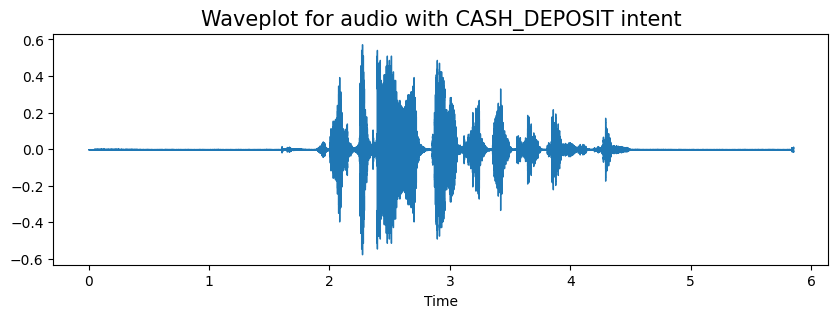

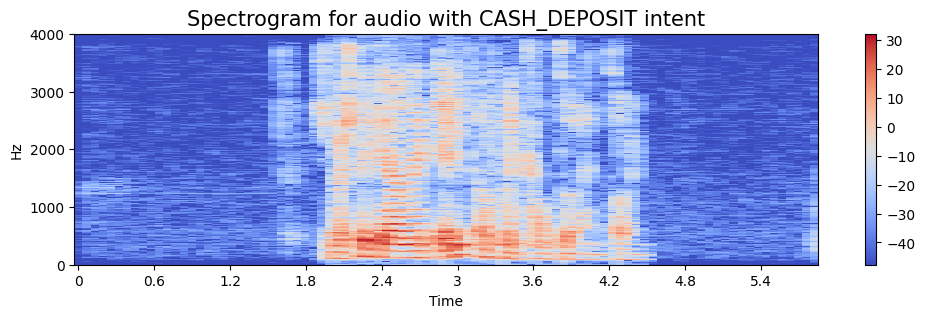

Hallo ich möchte fragen ob ich Geld auf mein Konto einzahlen kann oder halt wie kann ich das genau machen ich will Bargeld auf mein Konto einzahlen weil ich kann auch von einem Konto auf ein anderes Konto Geld überweisen


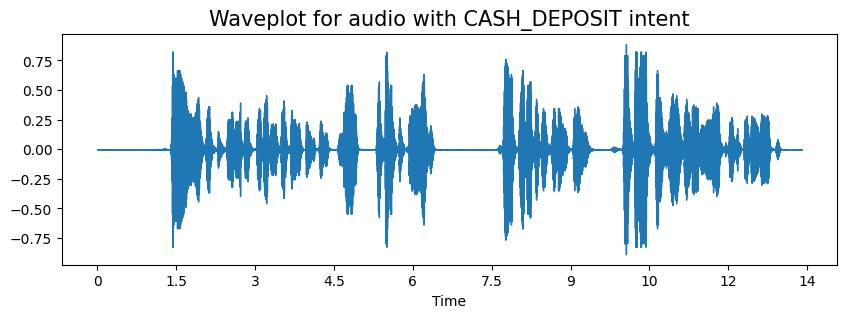

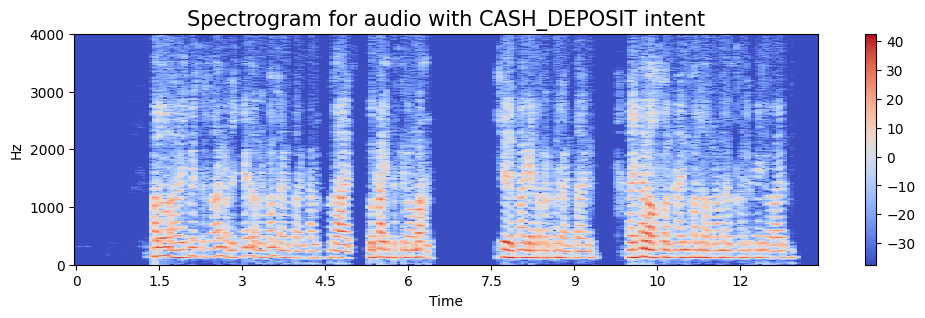

Hallo ich möchte gerne Geld einbezahlen auf mein Konto wie kann ich das tun


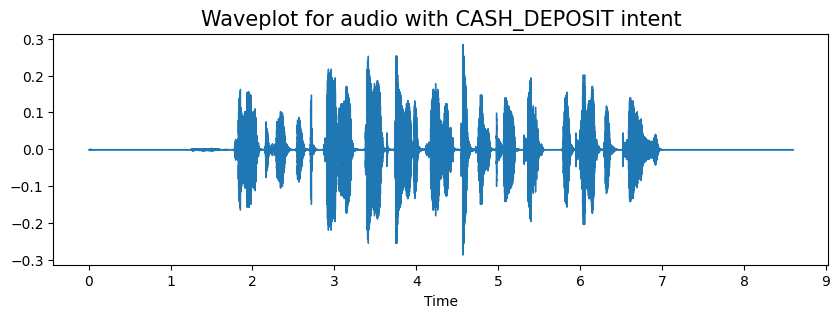

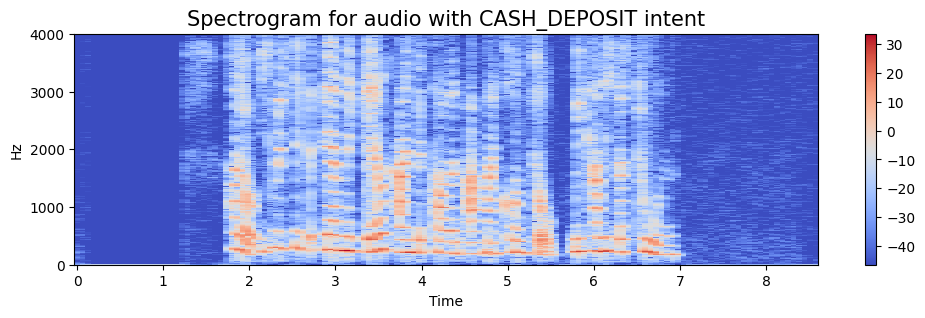

was muss ich tun um Geld auf mein Konto einzuzahlen


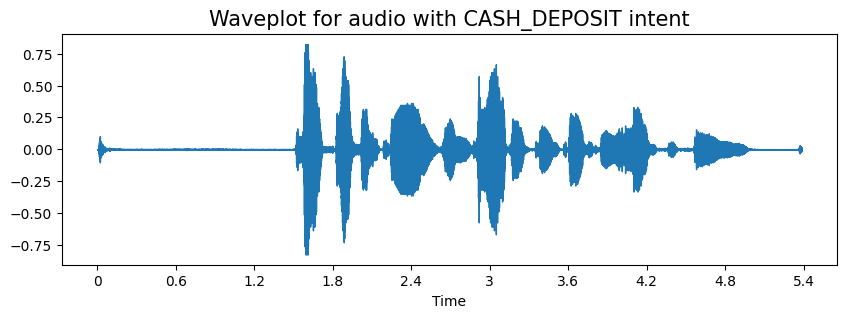

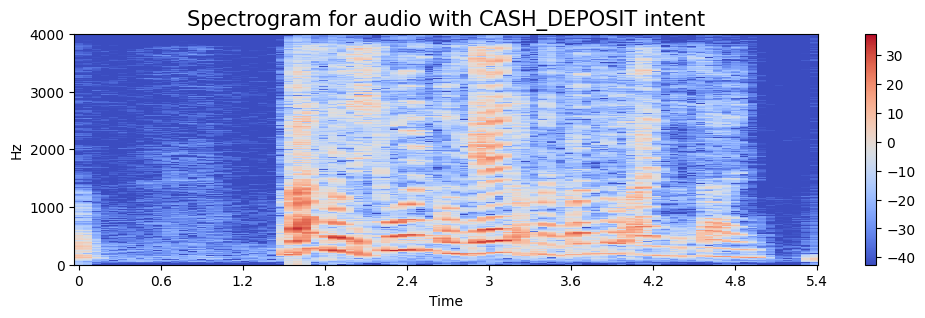

guten Tag ich wollte gerne Geld einzahlen und wollte einmal fragen wie es geht und dann auch direkt wie man das Geld aufs Konto überweisen kann


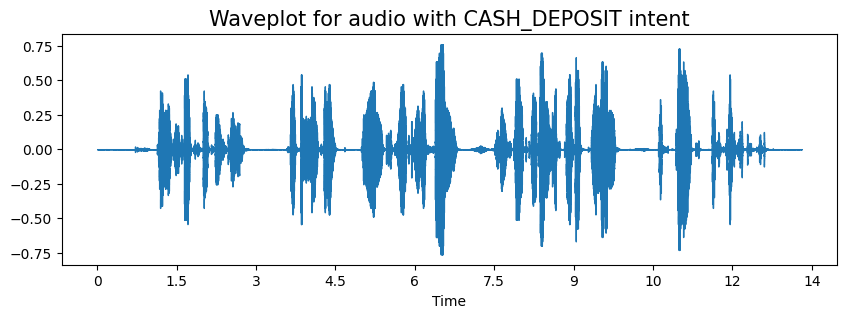

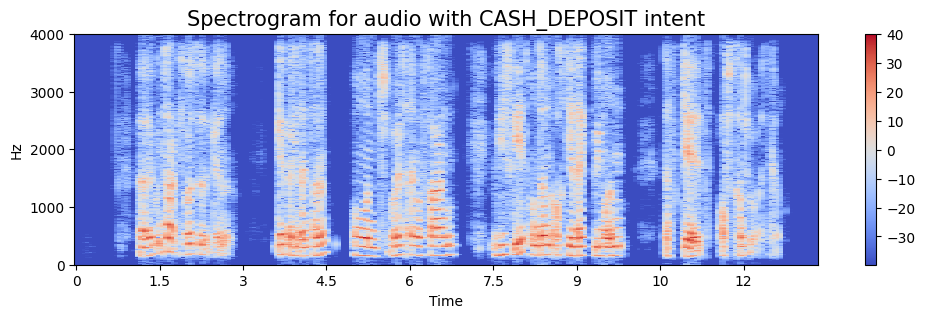

In [11]:
# Example usage
csv_file = "./MInDS-14/text/de-DE.csv"
audio_base_path = "./MInDS-14/audio"

df = load_audio_data(csv_file, audio_base_path)

# Plotting for the first few rows as an example
for index, row in df.head(5).iterrows():
    data, sr = row['audio_data']
    print(row['text_asr'])
    create_waveplot(data, sr, row['intent'])
    create_spectrogram(data, sr, row['intent'])
    display(play_audio(data, sr))


### Auxilary Data!

In [12]:
aux_en_df = pd.read_csv('./MInDS-14/aux-en.csv')

In [13]:
# aux_en_df
print(aux_en_df.isna().values.any())
print(aux_en_df.isnull().values.any())

False
False


In [14]:
aux_en_df.head()

,I need to pay a bill,PAY_BILL
0,pay bills,PAY_BILL
1,make a payment,PAY_BILL
2,can i pay a bill please,PAY_BILL
3,can i pay a bill,PAY_BILL
4,i want to pay a bill please,PAY_BILL


Looks like the aux_en_df dosen't have columns, so letes provide ones!

In [15]:
aux_en_df.columns = ['text', 'intent']

In [16]:
aux_en_df.head()

,text,intent
0,pay bills,PAY_BILL
1,make a payment,PAY_BILL
2,can i pay a bill please,PAY_BILL
3,can i pay a bill,PAY_BILL
4,i want to pay a bill please,PAY_BILL


/var/folders/sf/f6mp34nd5vl3m3wt1sk575br0000gn/T/ipykernel_92232/1164200256.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='intent', data=aux_en_df, order=aux_en_df['intent'].value_counts().index, palette='flare')


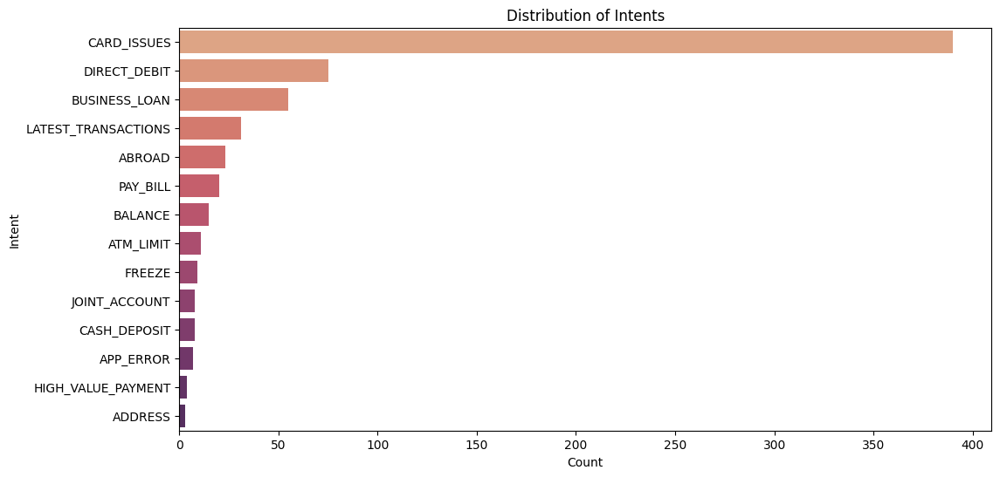

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.countplot(y='intent', data=aux_en_df, order=aux_en_df['intent'].value_counts().index, palette='flare')
plt.xlabel('Count')
plt.ylabel('Intent')
plt.title('Distribution of Intents')
plt.show()

In [18]:
aux_en_df

,text,intent
0,pay bills,PAY_BILL
1,make a payment,PAY_BILL
2,can i pay a bill please,PAY_BILL
3,can i pay a bill,PAY_BILL
4,i want to pay a bill please,PAY_BILL
...,...,...
654,I've got some cash to deposit,CASH_DEPOSIT
655,How do I transfer cash into the account,CASH_DEPOSIT
656,Can I come to a branch to give you some cash to transfer,CASH_DEPOSIT
657,Where do I go to deposit cash?,CASH_DEPOSIT


In [21]:
import numpy as np
import librosa

def augment_audio(data, sr):
    # Time stretching
    data = librosa.effects.time_stretch(data, rate=1.1)
    # Pitch shifting
    data = librosa.effects.pitch_shift(data, sr=sr, n_steps=2)
    # Adding noise
    noise = np.random.randn(len(data))
    data = data + 0.005 * noise
    # Shifting
    shift = np.random.randint(sr // 10)
    data = np.roll(data, shift)
    # Volume control
    data = data * 1.1
    return data

def preprocess_audio(data, sr):
    # Normalization
    data = librosa.util.normalize(data)
    # Pre-emphasis
    data = librosa.effects.preemphasis(data)
    # Resampling
    data = librosa.resample(data, orig_sr=sr, target_sr=16000)
    # Trimming silence
    data, _ = librosa.effects.trim(data)
    return data


Intent: CASH_DEPOSIT
Original Data:


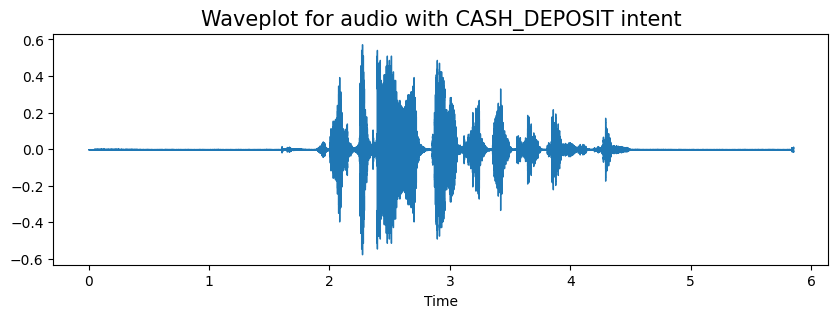

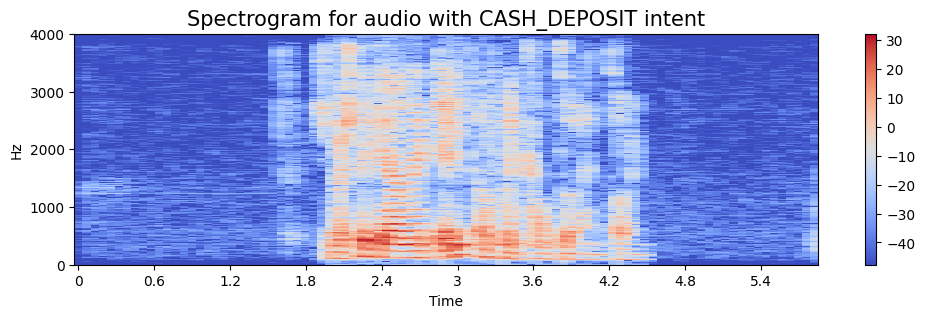

Preprocessed Data:


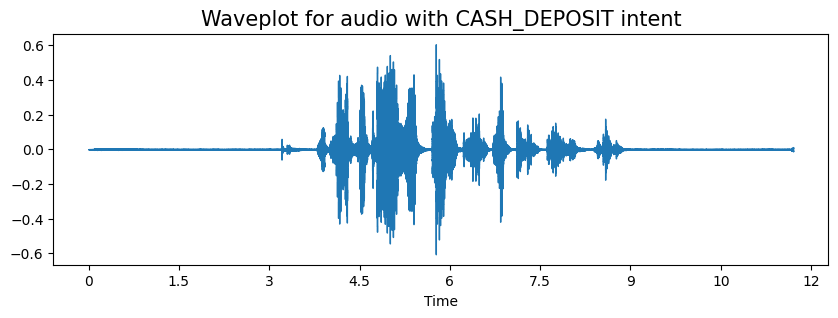

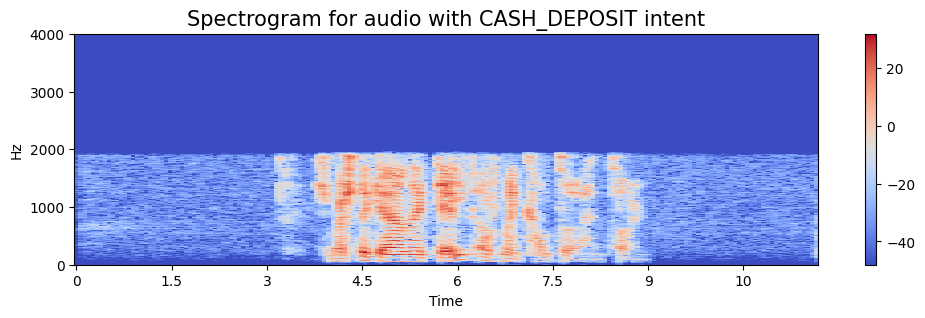

Augmented Data:


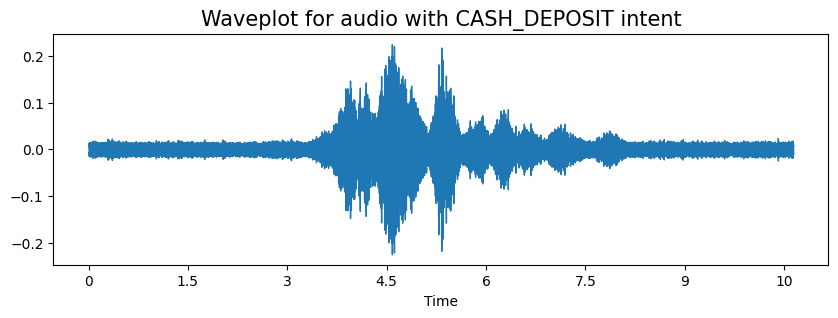

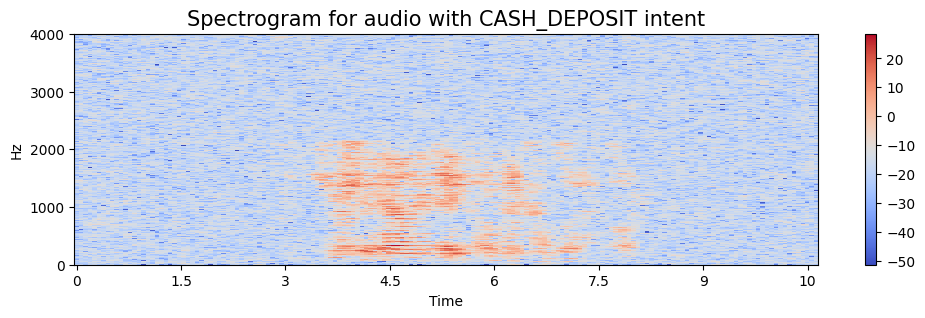

Intent: CASH_DEPOSIT
Original Data:


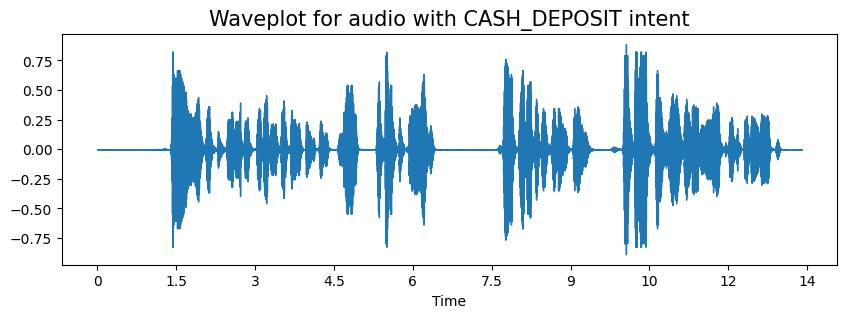

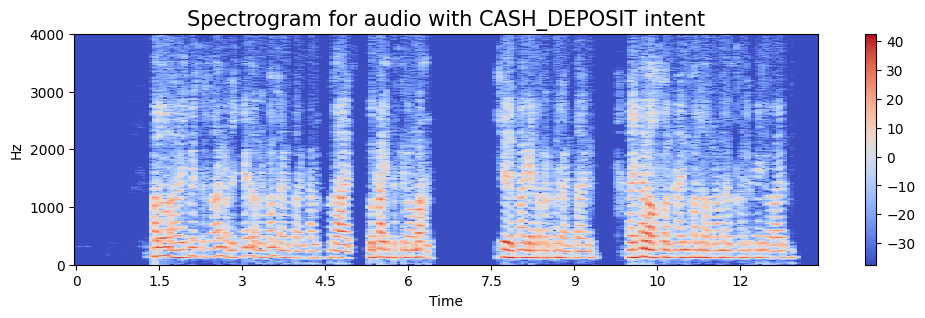

Preprocessed Data:


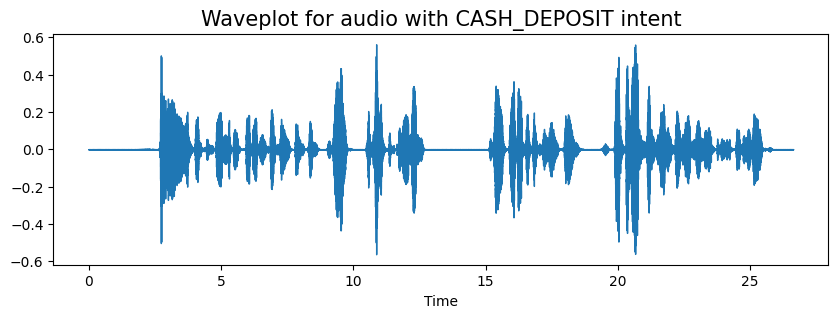

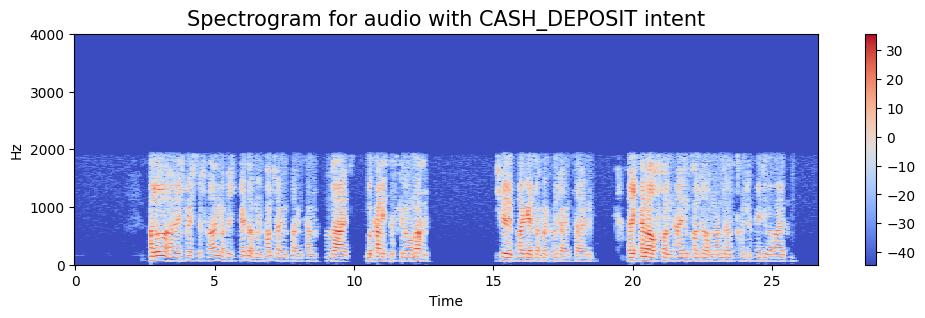

Augmented Data:


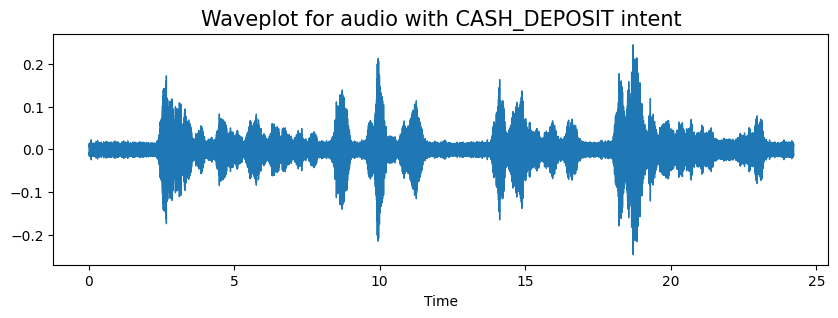

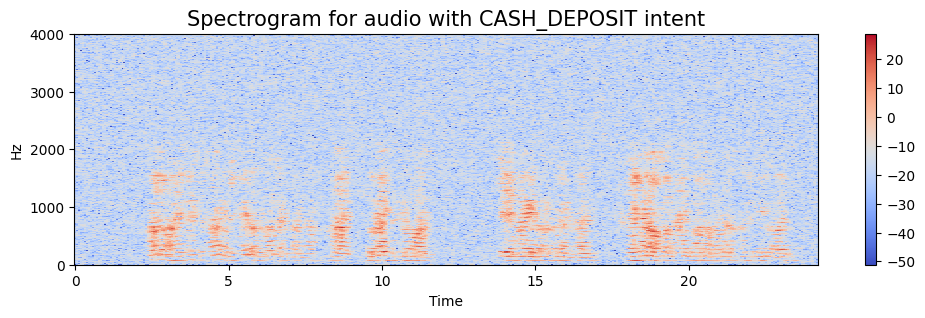

Intent: CASH_DEPOSIT
Original Data:


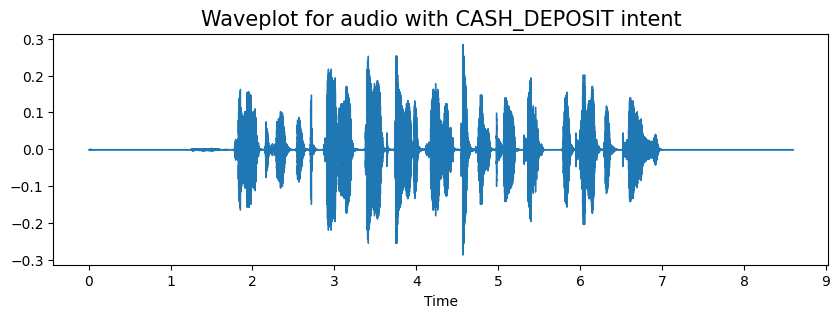

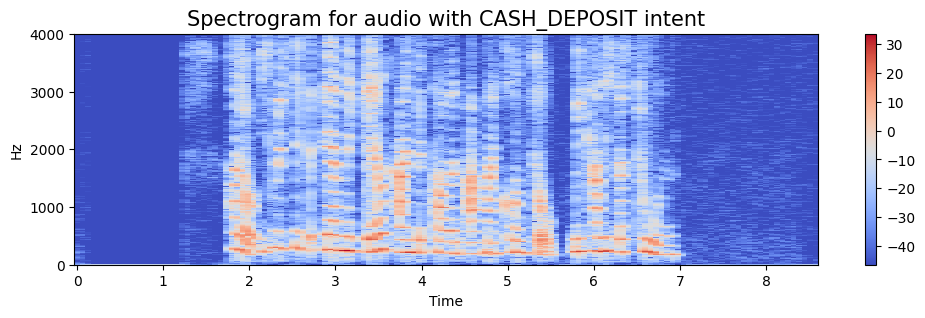

Preprocessed Data:


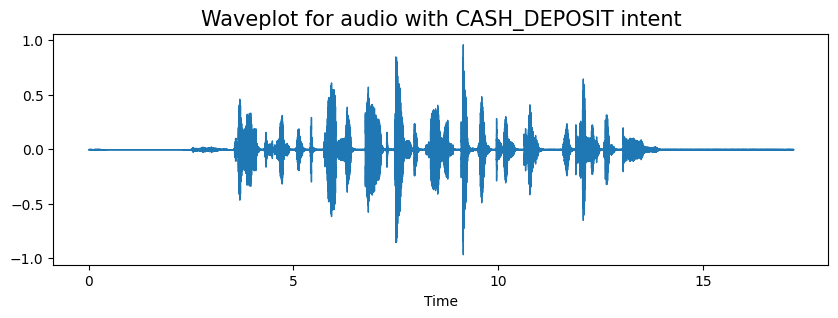

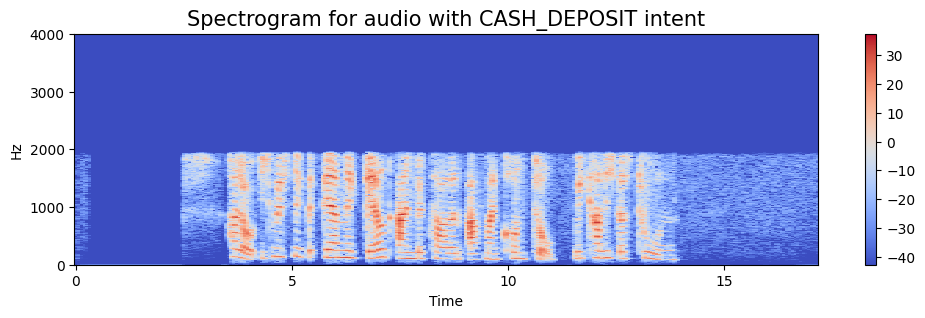

Augmented Data:


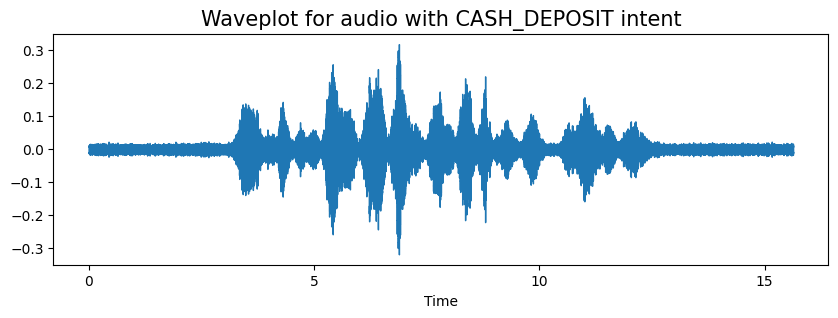

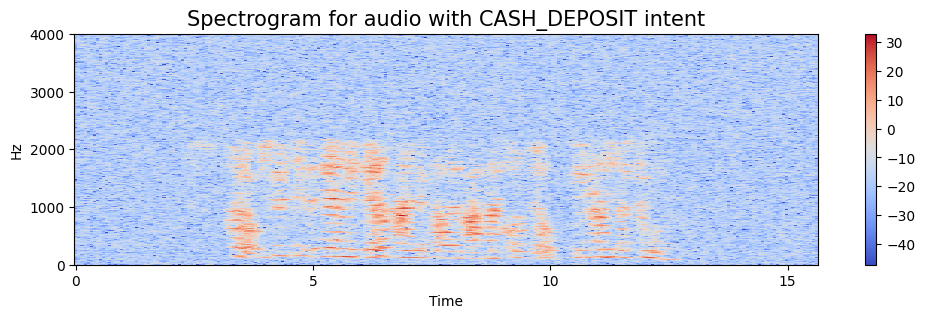

Intent: CASH_DEPOSIT
Original Data:


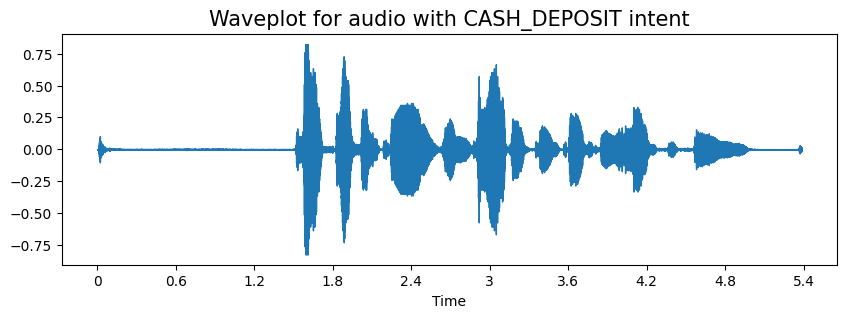

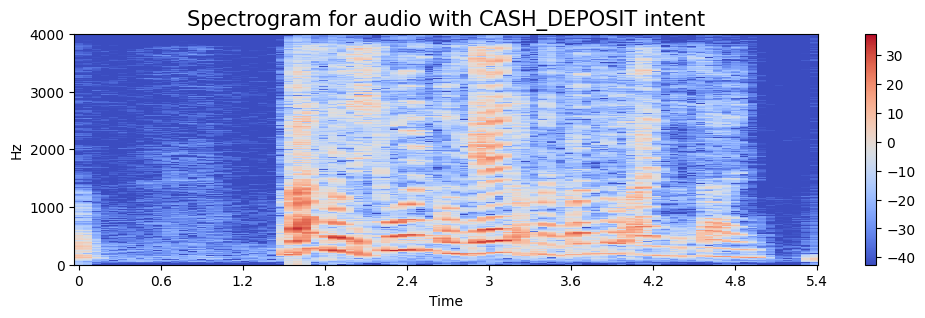

Preprocessed Data:


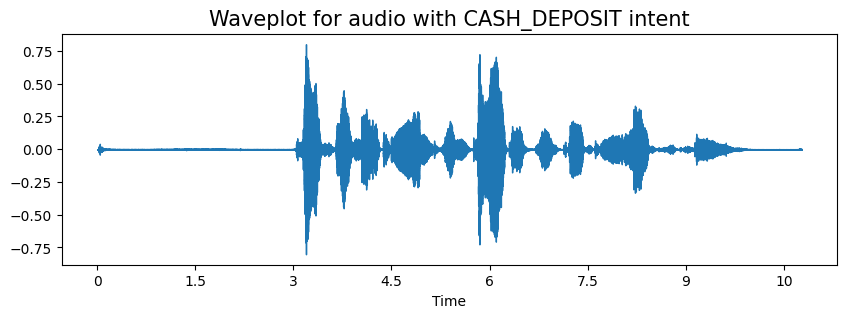

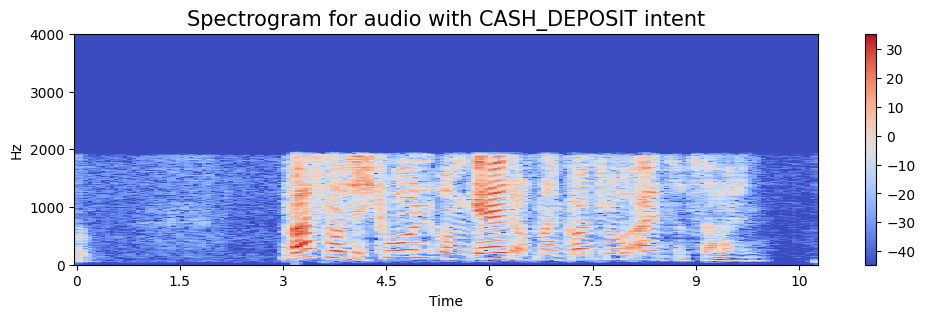

Augmented Data:


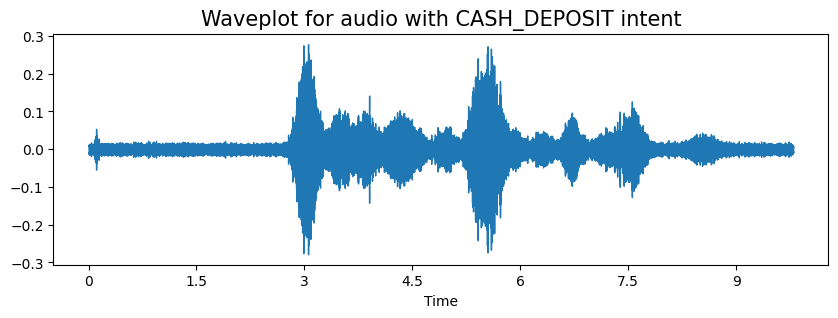

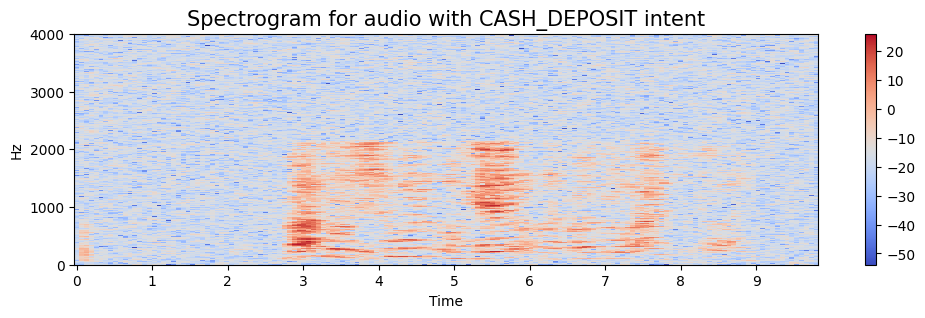

Intent: CASH_DEPOSIT
Original Data:


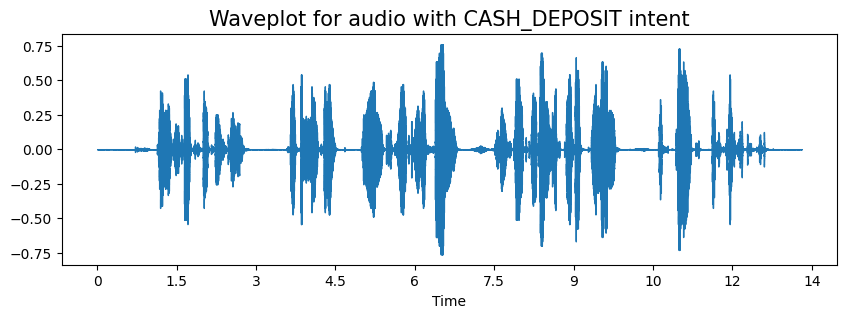

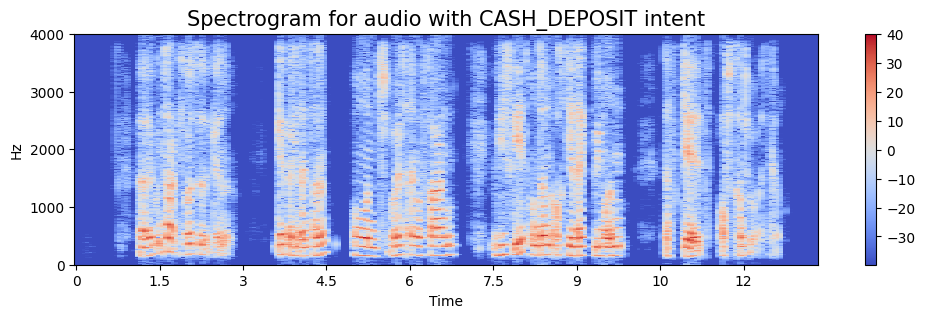

Preprocessed Data:


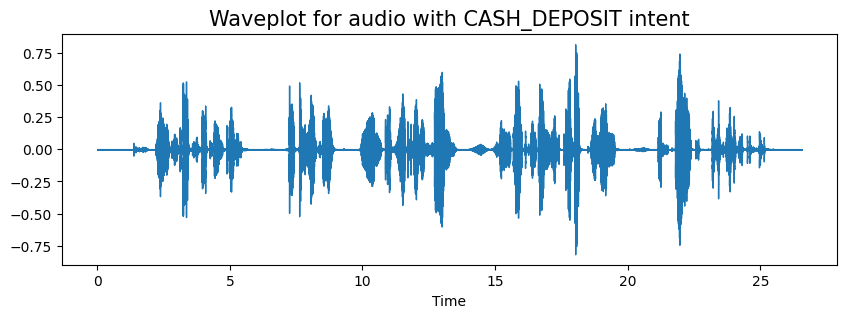

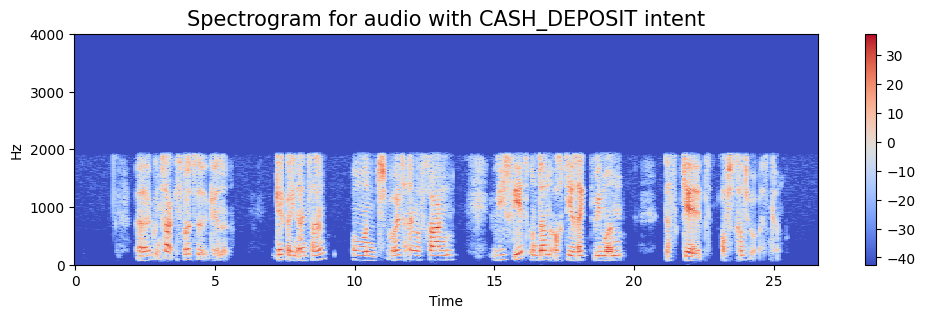

Augmented Data:


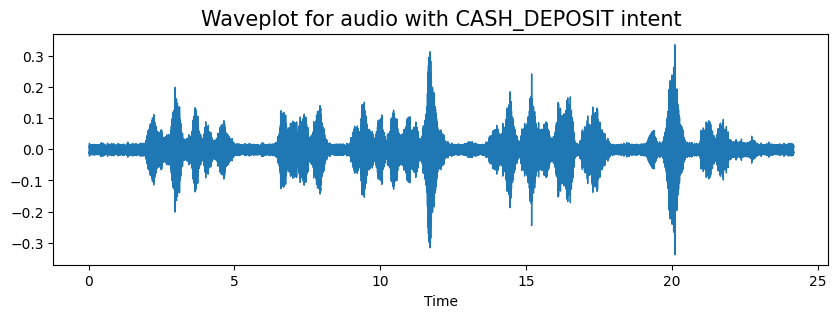

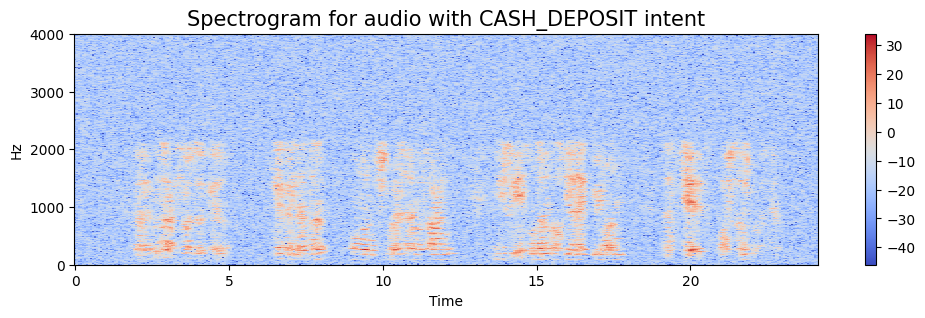

In [22]:
# Display processed data from augmentation for the first few rows
for index, row in df.head(5).iterrows():
    data, sr = row['audio_data']
    # Preprocess and augment the audio data
    preprocessed_data = preprocess_audio(data, sr)
    augmented_data = augment_audio(preprocessed_data, sr)
    
    print(f"Intent: {row['intent']}")
    
    # Visualize original data
    print("Original Data:")
    create_waveplot(data, sr, row['intent'])
    create_spectrogram(data, sr, row['intent'])
    display(play_audio(data, sr))
    
    # Visualize preprocessed data
    print("Preprocessed Data:")
    create_waveplot(preprocessed_data, sr, row['intent'])
    create_spectrogram(preprocessed_data, sr, row['intent'])
    display(play_audio(preprocessed_data, sr))
    
    # Visualize augmented data
    print("Augmented Data:")
    create_waveplot(augmented_data, sr, row['intent'])
    create_spectrogram(augmented_data, sr, row['intent'])
    display(play_audio(augmented_data, sr))

